https://github.com/ayoolaolafenwa/PixelLib/blob/master/Tutorials/image_pascalvoc.md

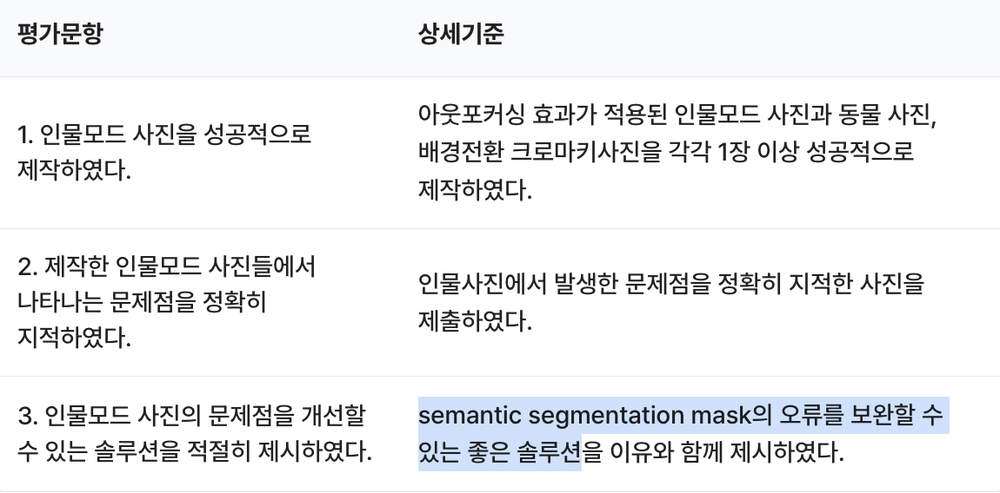

https://kor.pngtree.com

In [1]:
import os
from importlib.metadata import version
import cv2
import urllib
import pixellib
from pixellib.semantic import semantic_segmentation

from matplotlib import pyplot as plt
import numpy as np

In [6]:
ls ~/aiffel/human_segmentation/images

araki1.png  araki3.png  galaxy.png    kawauso2.png   swim.png
araki2.png  araki4.png  kawauso1.png  my_image.png@


In [2]:
img_list = ["araki1.png", "araki3.png", "galaxy.png", "kawauso2.png", 
            "swim.png", "araki2.png", "araki4.png", "kawauso1.png"]
img_list.sort()
img_list

['araki1.png',
 'araki2.png',
 'araki3.png',
 'araki4.png',
 'galaxy.png',
 'kawauso1.png',
 'kawauso2.png',
 'swim.png']

In [27]:
len(img_list)

8

### 순서
1. os.getenv("HOME") +  
2. os.path.join()  
3. cv2.imread() 
4. cv2.cvtColor(cv2.imread(), cv2.COLOR_BGR2RGB)
5. plt.imshow()

In [3]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/'

In [4]:
araki1 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[0])), cv2.COLOR_BGR2RGB)
araki2 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[1])), cv2.COLOR_BGR2RGB)
araki3 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[2])), cv2.COLOR_BGR2RGB)
araki4 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[3])), cv2.COLOR_BGR2RGB)
galaxy = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[4])), cv2.COLOR_BGR2RGB)
kawauso1 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[5])), cv2.COLOR_BGR2RGB)
kawauso2 = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[6])), cv2.COLOR_BGR2RGB)
swim = cv2.cvtColor(cv2.imread(os.path.join(img_path, img_list[7])), cv2.COLOR_BGR2RGB)

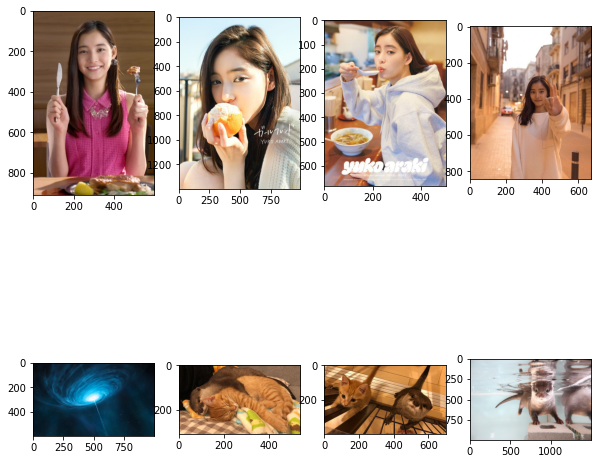

In [30]:
fig, axes = plt.subplots(nrows=2, ncols=4,
                        figsize=(10, 10))

axes[0][0].imshow(araki1)
axes[0][1].imshow(araki2)
axes[0][2].imshow(araki3)
axes[0][3].imshow(araki4)
axes[1][0].imshow(galaxy)
axes[1][1].imshow(kawauso1)
axes[1][2].imshow(kawauso2)
axes[1][3].imshow(swim)

plt.show()

In [5]:
araki1_path = os.path.join(img_path, img_list[0])
araki2_path = os.path.join(img_path, img_list[1])
araki3_path = os.path.join(img_path, img_list[2])
araki4_path = os.path.join(img_path, img_list[3])
galaxy_path = os.path.join(img_path, img_list[4])

kawauso1_path = os.path.join(img_path, img_list[5])
kawauso2_path = os.path.join(img_path, img_list[6])
swim_path = os.path.join(img_path, img_list[7])

In [6]:
model_dir = os.getenv('HOME') + '/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

urllib.request.urlretrieve(url = model_url, filename = model_file) 

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f0aea71fdc0>)

`dir(semantic_segmentation)`  
 __'load_ade20k_model',   
 'load_pascalvoc_model',__      
 'process_camera_ade20k',   
 'process_camera_pascalvoc',  
 'process_video_ade20k',  
 'process_video_pascalvoc',  
 'segmentAsAde20k',  
 __'segmentAsPascalvoc',__  
 'segmentFrameAsAde20k',  
 'segmentFrameAsPascalvoc']

model = `semantic_segmentation`(model_type='h5')  

---
model.`load_ade20k_model`(model_path)  

model.`load_pascalvoc_model`(model_path)  

model.`segmentAsPascalvoc`(
    __image_path__,
    process_frame=False,
    output_image_name=None,
    overlay=False,
    verbose=None,
)

In [7]:
model = semantic_segmentation()

# model1 = model.load_ade20k_model(model_file)
 
model.load_pascalvoc_model(model_file)

seg_values1 , output1 = model.segmentAsPascalvoc(araki1_path)
seg_values2 , output2 = model.segmentAsPascalvoc(araki2_path)
seg_values3 , output3 = model.segmentAsPascalvoc(araki3_path)
seg_values4 , output4 = model.segmentAsPascalvoc(araki4_path)
seg_values5 , output5 = model.segmentAsPascalvoc(galaxy_path)
seg_values6 , output6 = model.segmentAsPascalvoc(kawauso1_path)
seg_values7 , output7 = model.segmentAsPascalvoc(kawauso2_path)
seg_values8 , output8 = model.segmentAsPascalvoc(swim_path)

Pascal + Visual + object + classes

https://pixellib.readthedocs.io/en/stable/semantic.html
https://github.com/ayoolaolafenwa/PixelLib/blob/master/Tutorials/image_pascalvoc.md

In [8]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

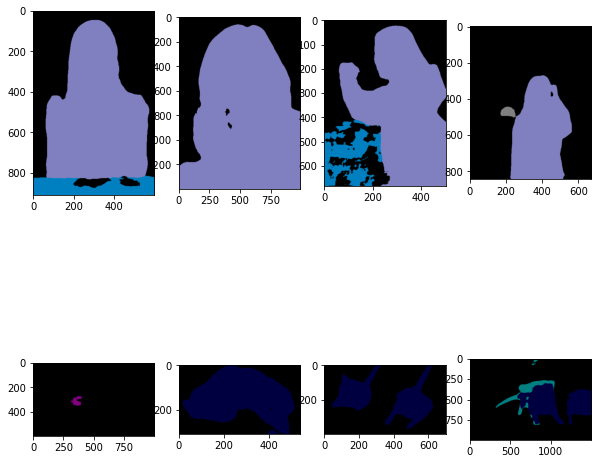

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=4,
                        figsize=(10, 10))

axes[0][0].imshow(output1)
axes[0][1].imshow(output2)
axes[0][2].imshow(output3)
axes[0][3].imshow(output4)

axes[1][0].imshow(output5)
axes[1][1].imshow(output6)
axes[1][2].imshow(output7)
axes[1][3].imshow(output8)

plt.show()

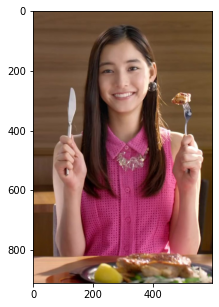

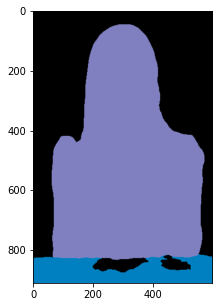

In [83]:
plt.imshow(araki1)

plt.figure()
plt.imshow(output1)

background  
diningtable  
person  

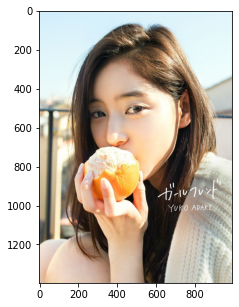

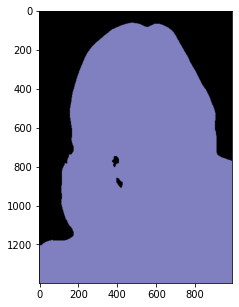

In [84]:
plt.imshow(araki2)

plt.figure()
plt.imshow(output2)

background  
person

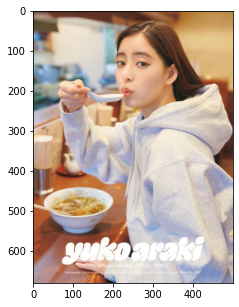

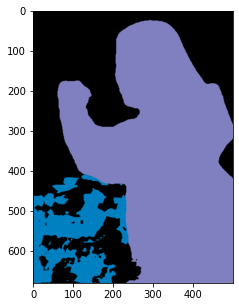

In [85]:
plt.imshow(araki3)

plt.figure()
plt.imshow(output3)

background  
diningtable  
person  

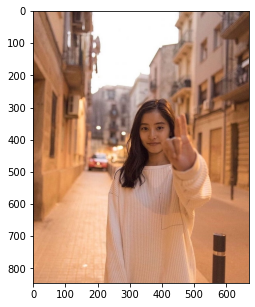

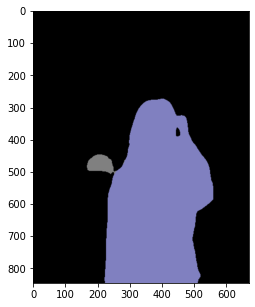

In [86]:
plt.imshow(araki4)

plt.figure()
plt.imshow(output4)

background  
car  
person  

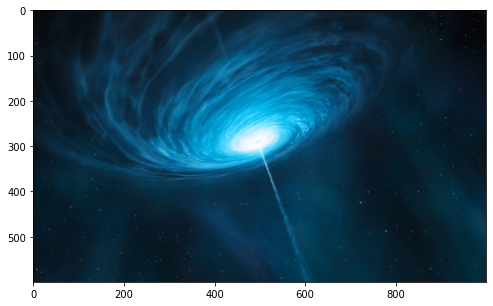

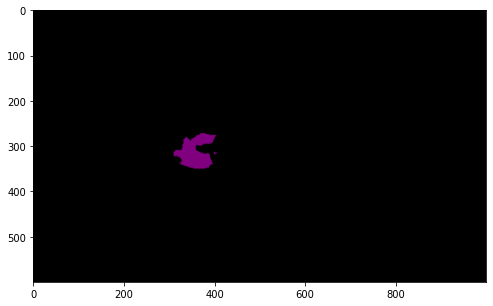

In [78]:
plt.imshow(galaxy)

plt.figure()
plt.imshow(output5)

background  
bottle  

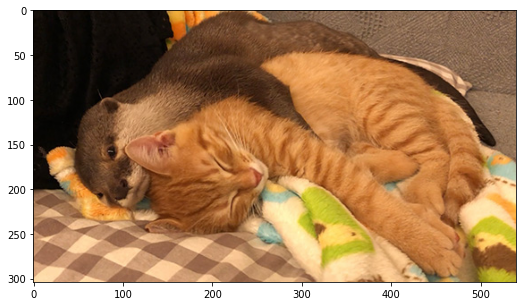

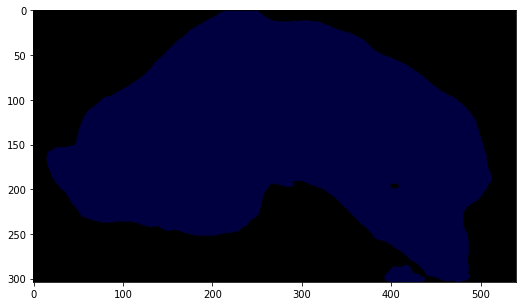

In [76]:
plt.imshow(kawauso1)

plt.figure()
plt.imshow(output6)

background  
cat  

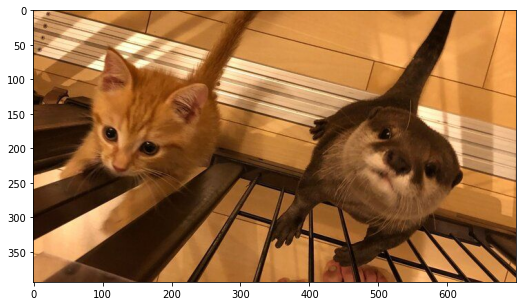

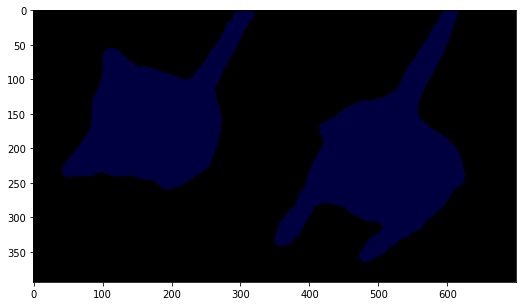

In [75]:
plt.imshow(kawauso2)

plt.figure()
plt.imshow(output7)

background  
cat  

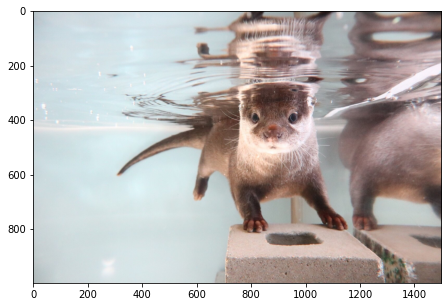

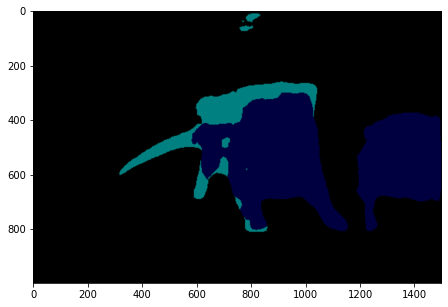

In [74]:
plt.imshow(swim)

plt.figure()
plt.imshow(output8)

background  
bird  
cat  

In [10]:
LABEL_NAMES.index("cat")

8

In [11]:
seg_values1.keys()

dict_keys(['class_ids', 'masks'])

In [12]:
seg_values1["class_ids"]

array([ 0, 11, 15])

In [16]:
print("-" * 10 + "araki1")
for i in seg_values1["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "araki2")
for i in seg_values2["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "araki3")
for i in seg_values3["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "araki4")
for i in seg_values4["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "galaxy")
for i in seg_values5["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "kawauso1")
for i in seg_values6["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "kawauso2")
for i in seg_values7["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10 + "swimming kawauso")
for i in seg_values8["class_ids"]:
    print(LABEL_NAMES[i])
print("-" * 10)

----------araki1
background
diningtable
person
----------araki2
background
person
----------araki3
background
diningtable
person
----------araki4
background
car
person
----------galaxy
background
bottle
----------kawauso1
background
cat
----------kawauso2
background
cat
----------swimming kawauso
background
bird
cat
----------


In [26]:
result_list = ["background", "cat", "bird", "bottle", "person", "diningtable", "car"]

for i in result_list:
    print("{}의 index : ".format(i), LABEL_NAMES.index(i))

background의 index :  0
cat의 index :  8
bird의 index :  3
bottle의 index :  5
person의 index :  15
diningtable의 index :  11
car의 index :  7


In [9]:
#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [30]:
for i in result_list:
    print("{}의 index :".format(i), LABEL_NAMES.index(i))
    print("{}의 RGB :".format(i), colormap[LABEL_NAMES.index(i)])
    print("-" * 22)

background의 index : 0
background의 RGB : [0 0 0]
----------------------
cat의 index : 8
cat의 RGB : [64  0  0]
----------------------
bird의 index : 3
bird의 RGB : [128 128   0]
----------------------
bottle의 index : 5
bottle의 RGB : [128   0 128]
----------------------
person의 index : 15
person의 RGB : [192 128 128]
----------------------
diningtable의 index : 11
diningtable의 RGB : [192 128   0]
----------------------
car의 index : 7
car의 RGB : [128 128 128]
----------------------


In [21]:
LABEL_NAMES[15]

'person'

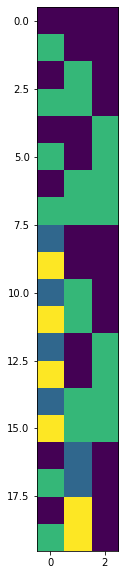

In [24]:
plt.figure(figsize=(10, 10))

# plt.legend(LABEL_NAMES[:])
plt.imshow(colormap[:20]);

In [10]:
#BGR segmentation color
# output은 BGR 순서
background_seg_color = (0, 0, 0)
cat_seg_color = (0,  0,  64)
bird_seg_color = (0, 128, 128)
bottle_seg_color = (128, 0, 128)
person_seg_color = (128, 128, 192)
diningtable_seg_color = (0, 128, 192)
car_seg_color = (128, 128, 128)

In [37]:
np.all((1, 2, 3), axis=0)

True

np.all  
Test whether all array elements along a given axis __evaluate to True__

In [11]:
seg_map1 = np.all(output1 == person_seg_color, axis= -1)
seg_map2 = np.all(output2 == person_seg_color, axis= -1)
seg_map3 = np.all(output3 == person_seg_color, axis= -1)
seg_map4 = np.all(output4 == person_seg_color, axis= -1)

seg_map5 = np.all(output5 == background_seg_color, axis= -1)
seg_map6 = np.all(output6 == cat_seg_color, axis= -1)
seg_map7 = np.all(output7 == cat_seg_color, axis= -1)
seg_map8 = np.all(output8 == background_seg_color, axis= -1)

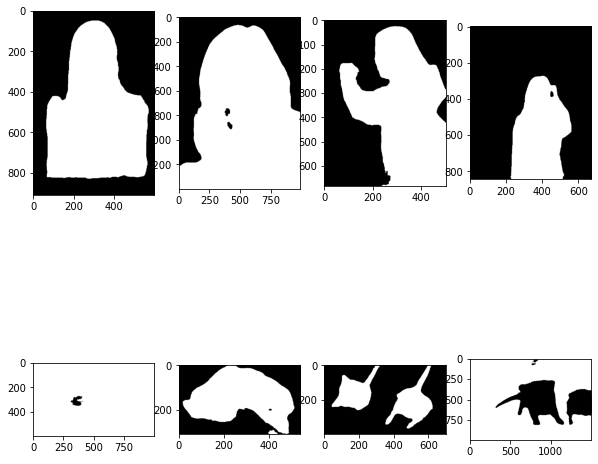

In [40]:
fig, axes = plt.subplots(nrows=2, ncols=4,
                        figsize=(10, 10))

axes[0][0].imshow(seg_map1, cmap="gray")
axes[0][1].imshow(seg_map2, cmap="gray")
axes[0][2].imshow(seg_map3, cmap="gray")
axes[0][3].imshow(seg_map4, cmap="gray")

axes[1][0].imshow(seg_map5, cmap="gray")
axes[1][1].imshow(seg_map6, cmap="gray")
axes[1][2].imshow(seg_map7, cmap="gray")
axes[1][3].imshow(seg_map8, cmap="gray")

plt.show()

In [45]:
type(seg_map1)

numpy.ndarray

In [41]:
seg_map1

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [12]:
img_mask1 = seg_map1.astype(np.uint8) * 255
img_mask2 = seg_map2.astype(np.uint8) * 255
img_mask3 = seg_map3.astype(np.uint8) * 255
img_mask4 = seg_map4.astype(np.uint8) * 255
img_mask5 = seg_map5.astype(np.uint8) * 255
img_mask6 = seg_map6.astype(np.uint8) * 255
img_mask7 = seg_map7.astype(np.uint8) * 255
img_mask8 = seg_map8.astype(np.uint8) * 255

In [44]:
img_mask1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [13]:
color_mask1 = cv2.applyColorMap(img_mask1, cv2.COLORMAP_JET)
color_mask2 = cv2.applyColorMap(img_mask2, cv2.COLORMAP_JET)
color_mask3 = cv2.applyColorMap(img_mask3, cv2.COLORMAP_JET)
color_mask4 = cv2.applyColorMap(img_mask4, cv2.COLORMAP_JET)
color_mask5 = cv2.applyColorMap(img_mask5, cv2.COLORMAP_JET)
color_mask6 = cv2.applyColorMap(img_mask6, cv2.COLORMAP_JET)
color_mask7 = cv2.applyColorMap(img_mask7, cv2.COLORMAP_JET)
color_mask8 = cv2.applyColorMap(img_mask8, cv2.COLORMAP_JET)

In [14]:
araki1_img = cv2.imread(araki1_path)
araki2_img = cv2.imread(araki2_path)
araki3_img = cv2.imread(araki3_path)
araki4_img = cv2.imread(araki4_path)

galaxy_img = cv2.imread(galaxy_path)
kawauso1_img = cv2.imread(kawauso1_path)
kawauso2_img = cv2.imread(kawauso2_path)
swim_img = cv2.imread(swim_path)

In [15]:
araki1_blur = cv2.blur(araki1_img, (13, 13))
araki2_blur = cv2.blur(araki2_img, (13, 13))
araki3_blur = cv2.blur(araki3_img, (13, 13))
araki4_blur = cv2.blur(araki4_img, (13, 13))

galaxy_blur = cv2.blur(galaxy_img, (13, 13))
kawauso1_blur = cv2.blur(kawauso1_img, (13, 13))
kawauso2_blur = cv2.blur(kawauso2_img, (13, 13))
swim_blur = cv2.blur(swim_img, (13, 13))

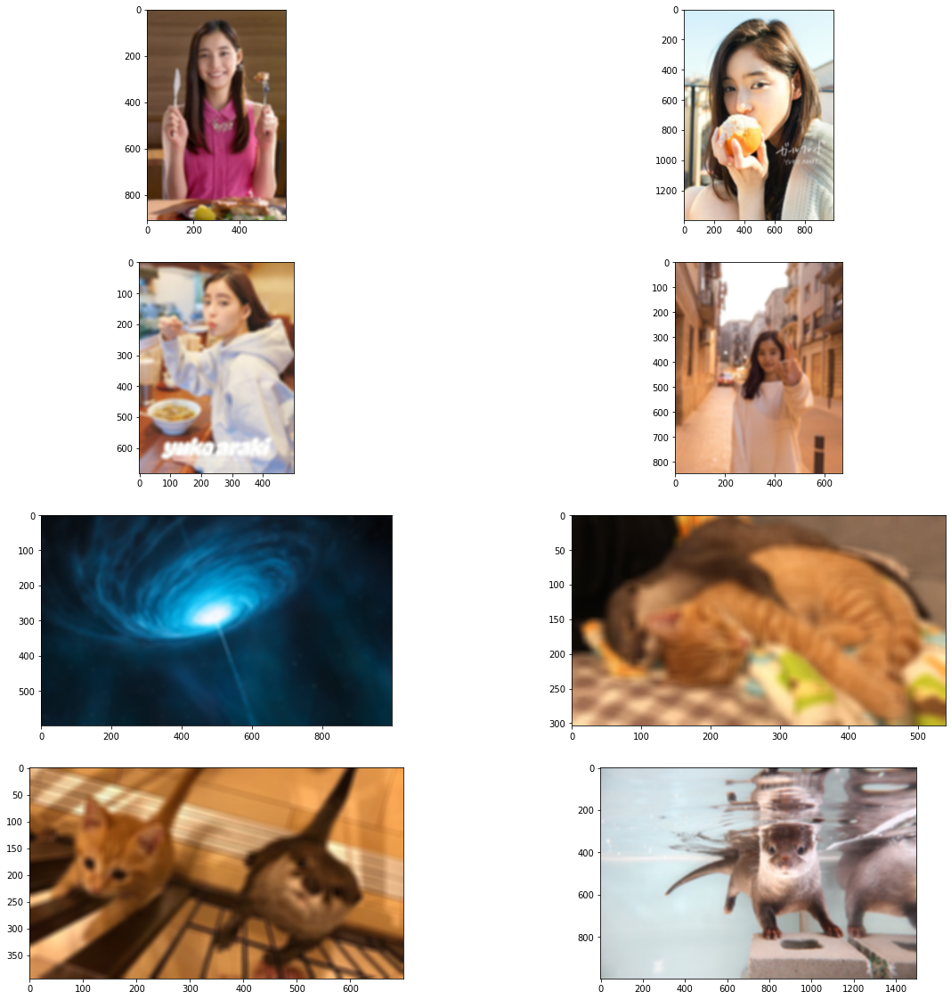

In [63]:
fig, axes = plt.subplots(nrows=4, ncols=2,
                        figsize=(20, 20))

axes[0][0].imshow(cv2.cvtColor(araki1_blur, cv2.COLOR_BGR2RGB))
axes[0][1].imshow(cv2.cvtColor(araki2_blur, cv2.COLOR_BGR2RGB))
axes[1][0].imshow(cv2.cvtColor(araki3_blur, cv2.COLOR_BGR2RGB))
axes[1][1].imshow(cv2.cvtColor(araki4_blur, cv2.COLOR_BGR2RGB))

axes[2][0].imshow(cv2.cvtColor(galaxy_blur, cv2.COLOR_BGR2RGB))
axes[2][1].imshow(cv2.cvtColor(kawauso1_blur, cv2.COLOR_BGR2RGB))
axes[3][0].imshow(cv2.cvtColor(kawauso2_blur, cv2.COLOR_BGR2RGB))
axes[3][1].imshow(cv2.cvtColor(swim_blur, cv2.COLOR_BGR2RGB));

In [64]:
img_bg_mask = cv2.bitwise_not(img_mask_color)

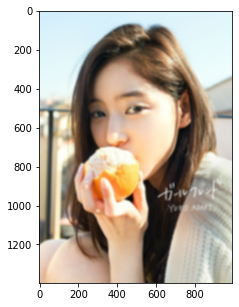

In [70]:
plt.imshow(cv2.cvtColor(araki2_blur, cv2.COLOR_BGR2RGB))

In [18]:
img_mask_color1 = cv2.cvtColor(img_mask1, cv2.COLOR_GRAY2BGR)
img_mask_color2 = cv2.cvtColor(img_mask2, cv2.COLOR_GRAY2BGR)
img_mask_color3 = cv2.cvtColor(img_mask3, cv2.COLOR_GRAY2BGR)
img_mask_color4 = cv2.cvtColor(img_mask4, cv2.COLOR_GRAY2BGR)

img_mask_color5 = cv2.cvtColor(img_mask5, cv2.COLOR_GRAY2BGR)
img_mask_color6 = cv2.cvtColor(img_mask6, cv2.COLOR_GRAY2BGR)
img_mask_color7 = cv2.cvtColor(img_mask7, cv2.COLOR_GRAY2BGR)
img_mask_color8 = cv2.cvtColor(img_mask8, cv2.COLOR_GRAY2BGR)

In [19]:
img_bg_mask1 = cv2.bitwise_not(img_mask_color1)
img_bg_mask2 = cv2.bitwise_not(img_mask_color2)
img_bg_mask3 = cv2.bitwise_not(img_mask_color3)
img_bg_mask4 = cv2.bitwise_not(img_mask_color4)

img_bg_mask5 = cv2.bitwise_not(img_mask_color5)
img_bg_mask6 = cv2.bitwise_not(img_mask_color6)
img_bg_mask7 = cv2.bitwise_not(img_mask_color7)
img_bg_mask8 = cv2.bitwise_not(img_mask_color8)

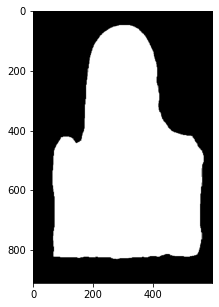

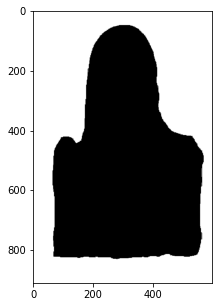

In [87]:
plt.imshow(img_mask_color1)

plt.figure()
plt.imshow(img_bg_mask1)

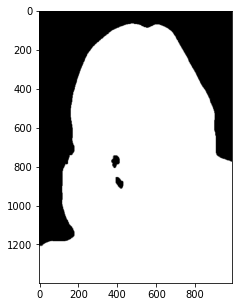

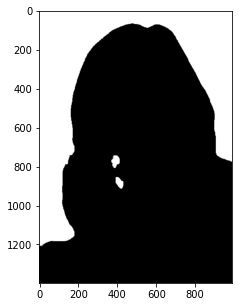

In [88]:
plt.imshow(img_mask_color2)

plt.figure()
plt.imshow(img_bg_mask2)

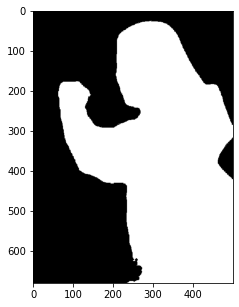

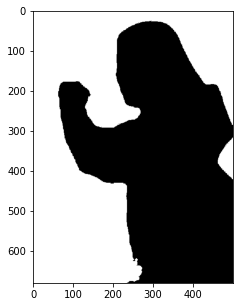

In [89]:
plt.imshow(img_mask_color3)

plt.figure()
plt.imshow(img_bg_mask3)

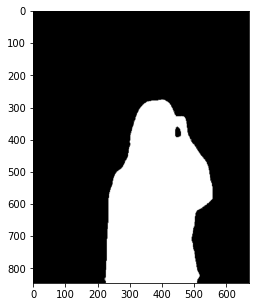

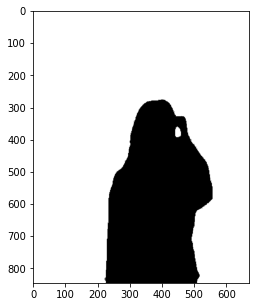

In [90]:
plt.imshow(img_mask_color4)

plt.figure()
plt.imshow(img_bg_mask4)

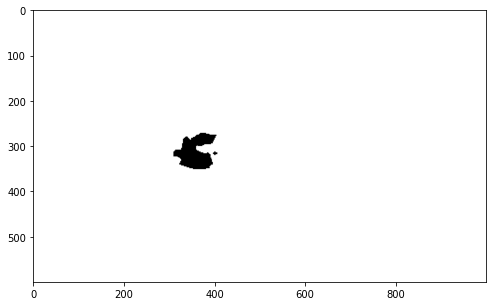

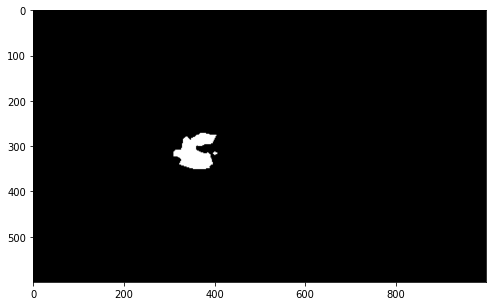

In [91]:
plt.imshow(img_mask_color5)

plt.figure()
plt.imshow(img_bg_mask5)
#galaxy

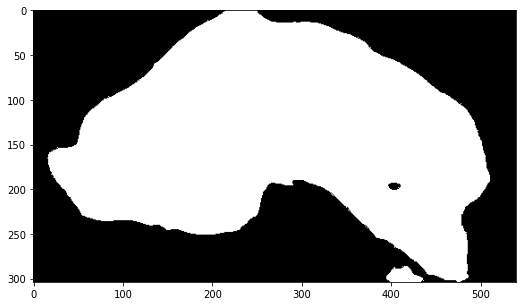

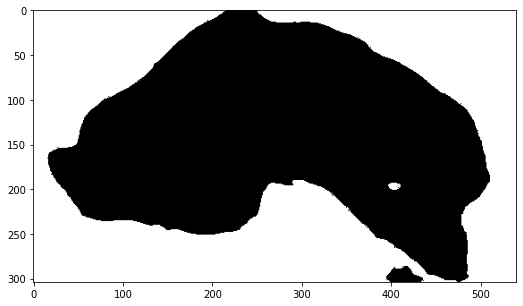

In [92]:
plt.imshow(img_mask_color6)

plt.figure()
plt.imshow(img_bg_mask6)
#neco & kawauso

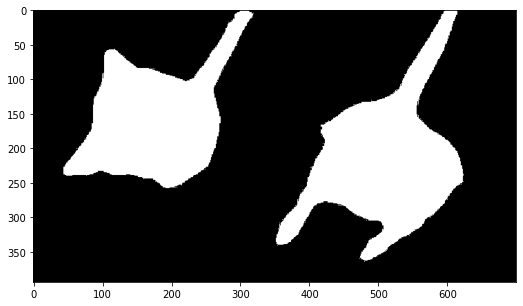

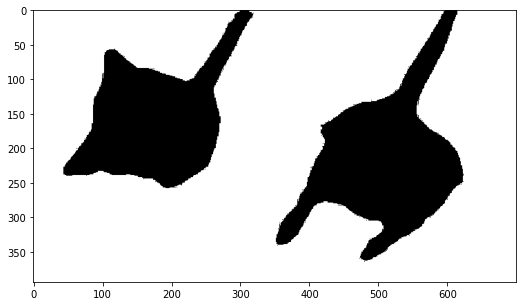

In [93]:
plt.imshow(img_mask_color7)

plt.figure()
plt.imshow(img_bg_mask7)
#neco & kawauso

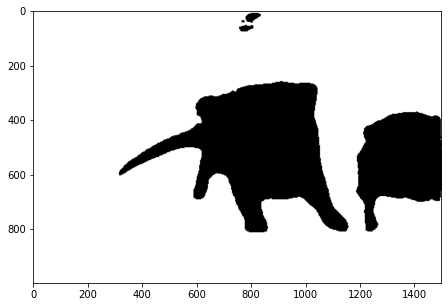

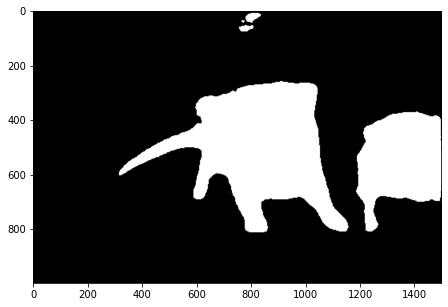

In [94]:
plt.imshow(img_mask_color8)

plt.figure()
plt.imshow(img_bg_mask8)
# kawauso is swiming

In [20]:
img_bg_blur1 = cv2.bitwise_and(araki1_blur, img_bg_mask1)
img_bg_blur2 = cv2.bitwise_and(araki2_blur, img_bg_mask2)
img_bg_blur3 = cv2.bitwise_and(araki3_blur, img_bg_mask3)
img_bg_blur4 = cv2.bitwise_and(araki4_blur, img_bg_mask4)

img_bg_blur5 = cv2.bitwise_and(galaxy_blur, img_bg_mask5)
img_bg_blur6 = cv2.bitwise_and(kawauso1_blur, img_bg_mask6)
img_bg_blur7 = cv2.bitwise_and(kawauso2_blur, img_bg_mask7)
img_bg_blur8 = cv2.bitwise_and(swim_blur, img_bg_mask8)

In [21]:
img_concat1 = np.where(img_mask_color1 == 255, araki1_img, img_bg_blur1)
img_concat2 = np.where(img_mask_color2 == 255, araki2_img, img_bg_blur2)
img_concat3 = np.where(img_mask_color3 == 255, araki3_img, img_bg_blur3)
img_concat4 = np.where(img_mask_color4 == 255, araki4_img, img_bg_blur4)

img_concat5 = np.where(img_mask_color5 == 255, galaxy_img, img_bg_blur5)
img_concat6 = np.where(img_mask_color6 == 255, kawauso1_img, img_bg_blur6)
img_concat7 = np.where(img_mask_color7 == 255, kawauso2_img, img_bg_blur7)
img_concat8 = np.where(img_mask_color8 == 255, swim_img, img_bg_blur8)

사람을 흰색(255)깔 칠한 부분의 순번이 나오면  
그 부분의 araki의 숫자로 덮어 씌워주고  
그 외의 순간은 blur한 부분으로 숫자로 덮어 씌어줘!

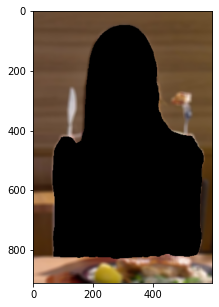

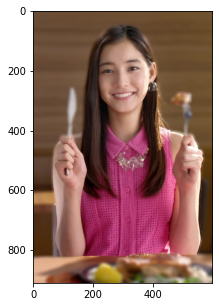

In [97]:
plt.imshow(cv2.cvtColor(img_bg_blur1, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB));

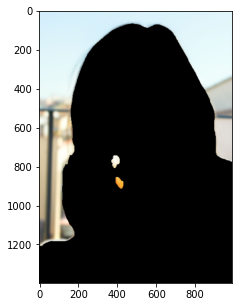

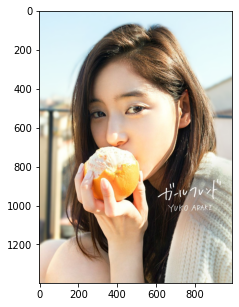

In [98]:
plt.imshow(cv2.cvtColor(img_bg_blur2, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat2, cv2.COLOR_BGR2RGB));

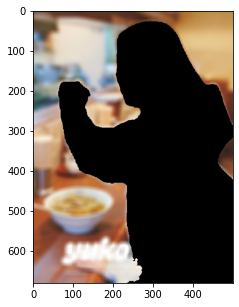

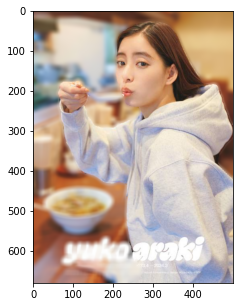

In [99]:
plt.imshow(cv2.cvtColor(img_bg_blur3, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB));

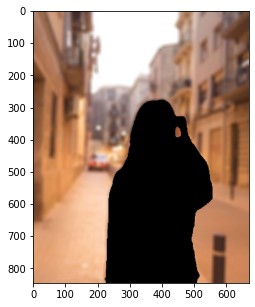

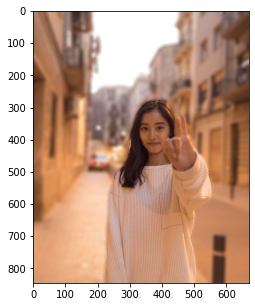

In [100]:
plt.imshow(cv2.cvtColor(img_bg_blur4, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat4, cv2.COLOR_BGR2RGB));

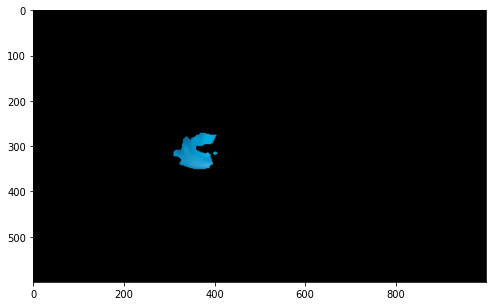

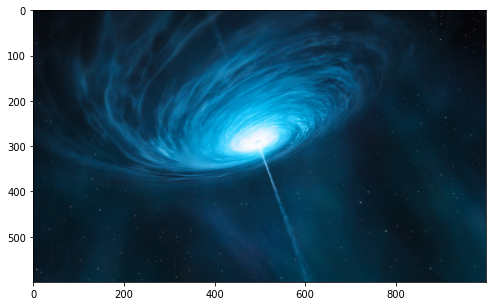

In [101]:
plt.imshow(cv2.cvtColor(img_bg_blur5, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat5, cv2.COLOR_BGR2RGB));

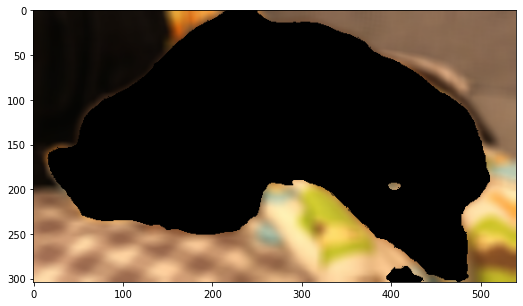

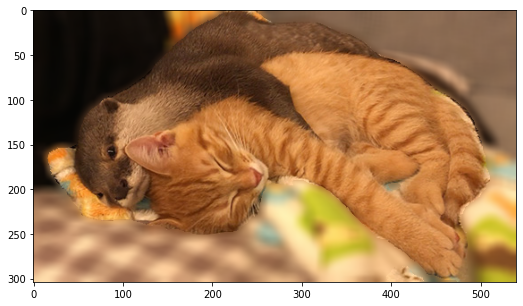

In [102]:
plt.imshow(cv2.cvtColor(img_bg_blur6, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat6, cv2.COLOR_BGR2RGB));

blanket또 고양이라고 인지하넹  
카와이이이이이이이이잉이이이이이이이이.이  

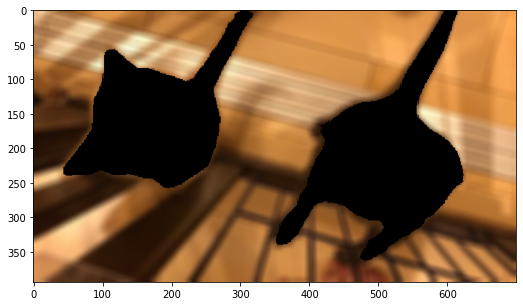

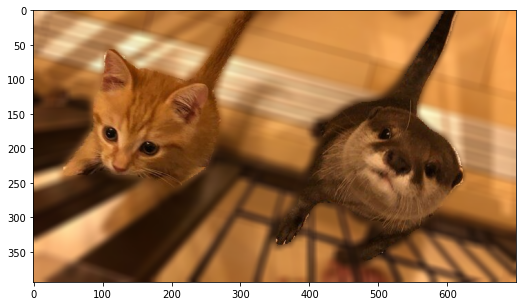

In [103]:
plt.imshow(cv2.cvtColor(img_bg_blur7, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat7, cv2.COLOR_BGR2RGB));

고양이 손 짤렸따..  
수달을 고양이라고 인식한다. 오..  

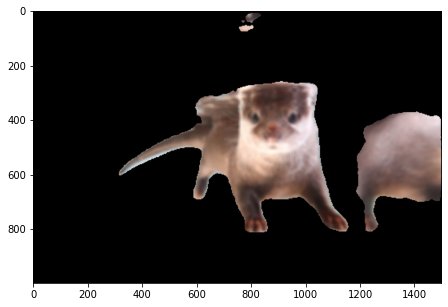

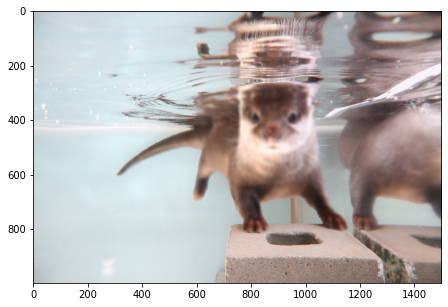

In [104]:
plt.imshow(cv2.cvtColor(img_bg_blur8, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(cv2.cvtColor(img_concat8, cv2.COLOR_BGR2RGB));

수달 또한 blur처리가 되어버렸넹  
오히려 벽돌이 blur가 안되었어...

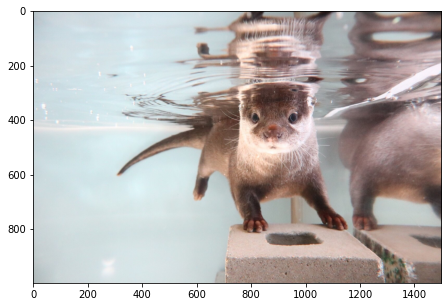

In [105]:
plt.imshow(swim);

# 배경화면 바꿔보기!

(600, 1000, 3)
(845, 670, 3)


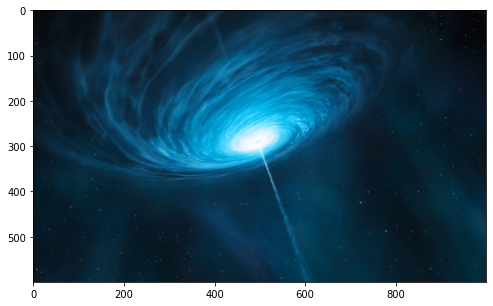

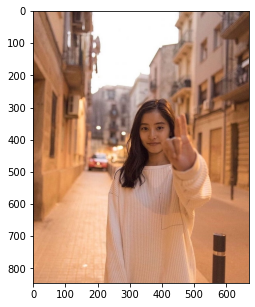

In [107]:
plt.imshow(galaxy)
print(galaxy.shape)

plt.figure()
plt.imshow(araki4);
print(araki4.shape)

dsize = (845, 670)   
-->  
shape -> (670, 845, 3)  
당황쓰

In [111]:
galaxy4 = cv2.resize(src = galaxy, 
                     dsize = (670, 845), 
                     interpolation= cv2.INTER_AREA)

(845, 670, 3)

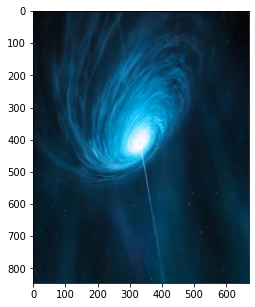

In [113]:
plt.imshow(galaxy4);
galaxy4.shape

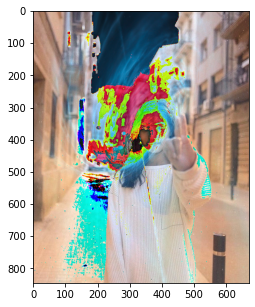

In [124]:
plt.imshow(galaxy4 + araki4);

되긴 하네.. 근대 무섭...

In [115]:
galaxy_4 = cv2.resize(src = img_mask_color5, 
                    dsize = (670, 845), 
                    interpolation= cv2.INTER_AREA)

In [118]:
img_con = np.where(img_mask_color4 == 255, araki4_img, galaxy4)

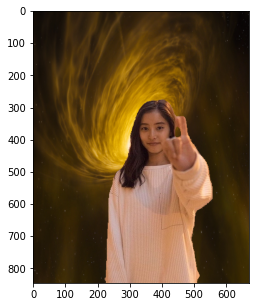

In [122]:
plt.imshow(cv2.cvtColor(img_con, cv2.COLOR_BGR2RGB));

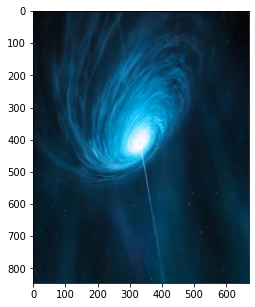

In [129]:
plt.imshow(galaxy4)

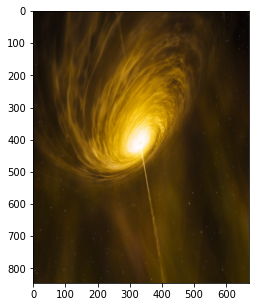

In [131]:
galaxy_4 = cv2.resize(src = galaxy_img, 
                    dsize = (670, 845), 
                    interpolation= cv2.INTER_AREA)
plt.imshow(galaxy_4);

In [132]:
araki_in_galaxy = np.where(img_mask_color4 == 255, araki4_img, galaxy_4)

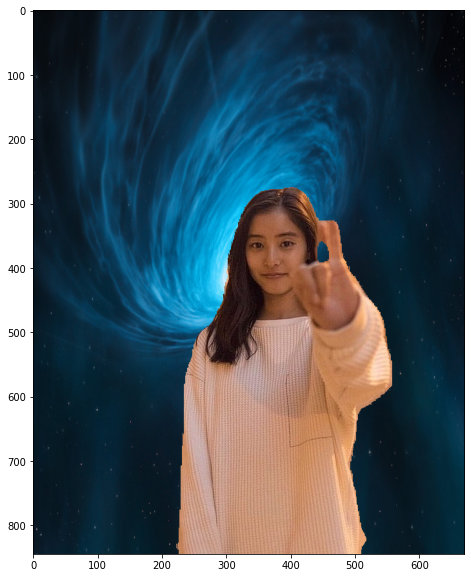

In [134]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(araki_in_galaxy, cv2.COLOR_BGR2RGB));

"약지"손가락의 일부분을 우주 속으로 날려버리네 ㅋㅋㅋㅋ

In [25]:
kawauso1_img.shape, kawauso2_img.shape, swim_img.shape

((304, 540, 3), (394, 700, 3), (998, 1499, 3))

In [26]:
pool_1 = cv2.resize(src= swim_img, 
                      dsize=(540, 304),
                      interpolation= cv2.INTER_AREA)

pool_2 = cv2.resize(src= swim_img, 
                      dsize=(700, 394),
                      interpolation= cv2.INTER_AREA)

In [31]:
kawauso1_img.shape, pool_1.shape, img_mask_color6.shape

((304, 540, 3), (304, 540, 3), (304, 540, 3))

In [32]:
kawauso2_img.shape, pool_2.shape, img_mask_color7.shape

((394, 700, 3), (394, 700, 3), (394, 700, 3))

In [33]:
kawauso_in_pool_1 = np.where(img_mask_color6 == 255, kawauso1_img, pool_1)
kawauso_in_pool_2 = np.where(img_mask_color7 == 255, kawauso2_img, pool_2)

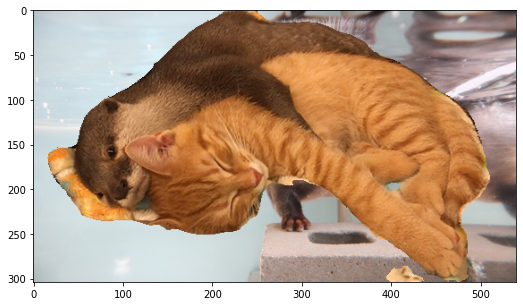

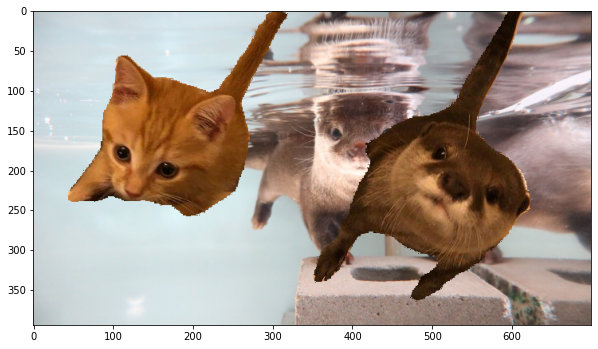

In [51]:
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(kawauso_in_pool_1, cv2.COLOR_BGR2RGB))

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(kawauso_in_pool_2, cv2.COLOR_BGR2RGB));

# 물 속에서도 꼬옥 안아주고 있어 카와이이이이이이이이이이이

고양이 팔은 인식 못하면서 수달 팔은 잘 인식하네 ㅋㅋㅋㅋㅋㅋㅋ  
그래도 카와이이이이이이

In [37]:
swim_img.shape, galaxy_img.shape, kawauso1_img.shape

((998, 1499, 3), (600, 1000, 3), (304, 540, 3))

In [39]:
space1 = cv2.resize(src=galaxy_img, dsize=(1499, 998), interpolation= cv2.INTER_AREA)

space2 = cv2.resize(src=galaxy_img, dsize=(540, 304), interpolation= cv2.INTER_AREA)

In [42]:
# 이 이미지만 고양이라고 착각한 수달을 반대로 마스크가 씌어졌다.
kawauso_in_space_1 = np.where(img_mask_color8 == 0, swim_img, space1)

kawauso_in_space_2 = np.where(img_mask_color6 == 255, kawauso1_img, space2)

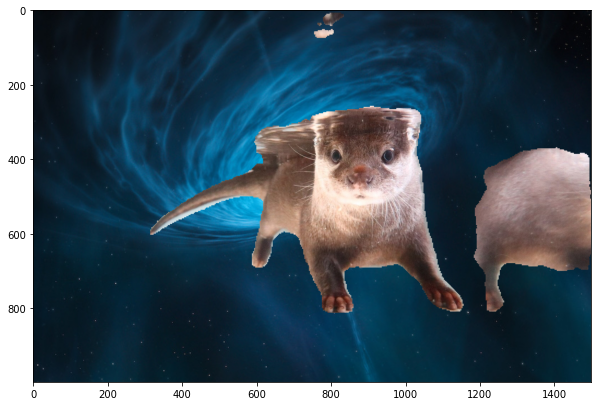

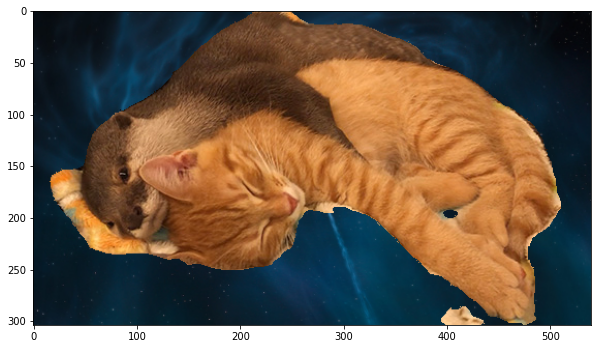

In [43]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(kawauso_in_space_1, cv2.COLOR_BGR2RGB))

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(kawauso_in_space_2, cv2.COLOR_BGR2RGB));

카와이이이이이이 우주 속에서도 꼬옥 안겨있어 카와이이이이이이

In [45]:
araki2_img.shape, kawauso2_img.shape

((1398, 990, 3), (394, 700, 3))

In [46]:
arujisama = cv2.resize(src=kawauso2_img, dsize=(990, 1398), interpolation=cv2.INTER_AREA)

In [47]:
feed_me = np.where(img_mask_color2 == 255, araki2_img, arujisama)

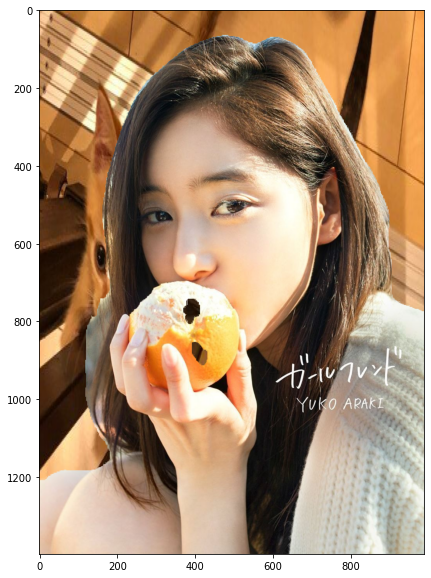

In [50]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(feed_me, cv2.COLOR_BGR2RGB));

오렌지를 사람이라고 인식하고 있어 ㅋㅋㅋㅋㅋ  
오렌지는 누가 파먹었나?! ㅋㅋㅋㅋ  
문구까지 사람이라 인식하넹  오...  
야옹이짱이 오렌지를 탐내고 있어 ㅋㅋㅋ

# Step 1. 인물모드 직접 해 보기
1. 최소 3장 이상의 인물모드 사진  
2. 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다.   
    시맨틱 세그멘테이션 스텝에서 힌트를 찾아봅시다.
3. 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다. 

# Step 2. 사진에서 문제점 찾기 
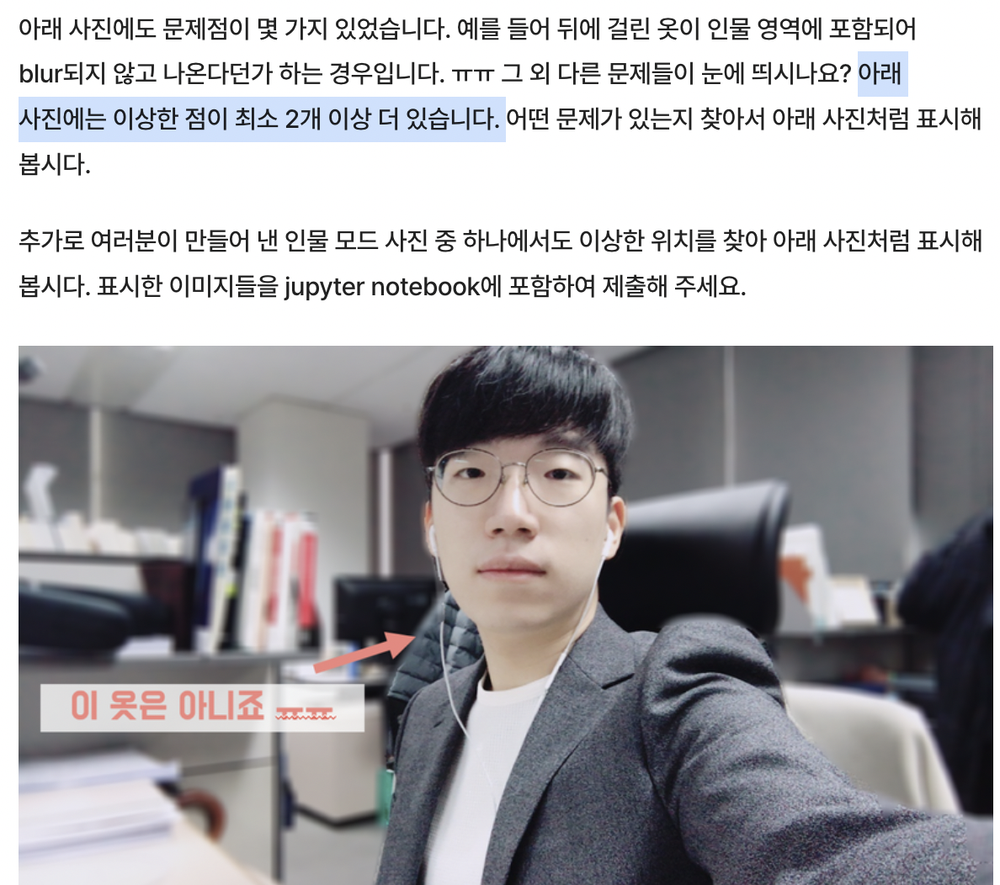

# Step 3. 해결 방법을 제안해 보기
소비자들의 눈높이는 그리 호락호락하지 않고, 엔지니어인 여러분들은 답을 찾아내야 합니다.
> 무섭..

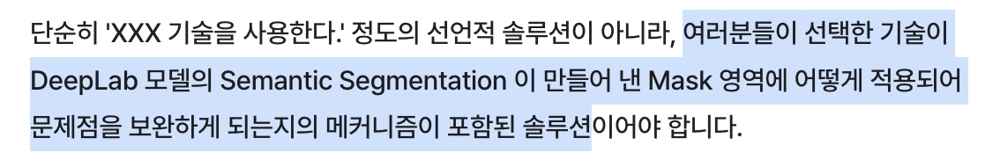

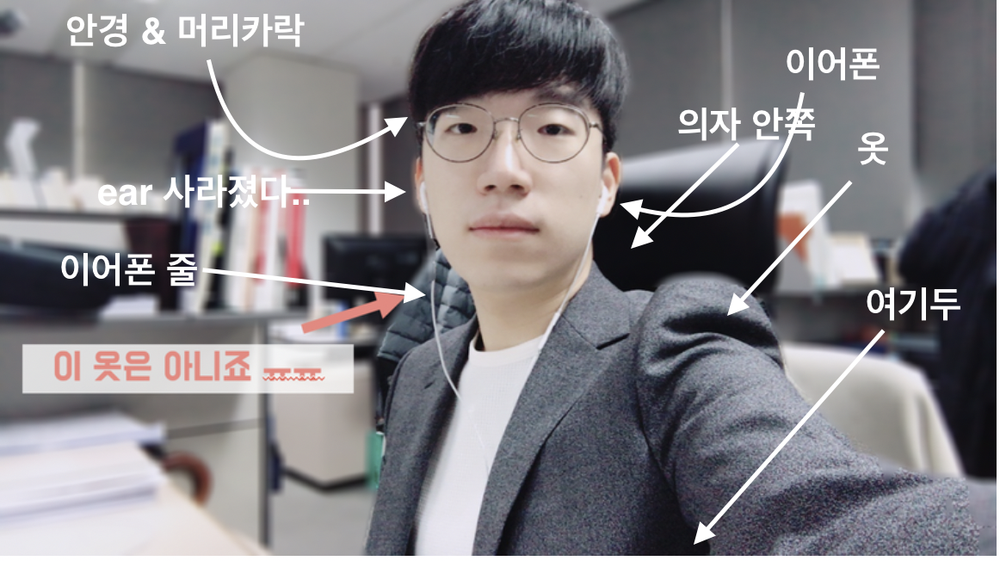

지금 보니 패딩 위치라인인 전부다네  
e.g. 초록색 종이백도 포함이네

아니다 사람을 모자이크 하고  
반대 부분인 배경의 모자이크를 없애면 되것다!

# 회고짱

### 전체적 과정
1. pre-trained V3+ DeepLab을 통해 사람[고양이, ...]의 위치를 파악을 시킨다. 
2. "원본 이미지"를 blur 이미지로 변형시켜서 "blur 이미지"의 숫자(RGB | BGR)를 알게되고  
3. 어느 부분만 blur를 할 것인지를 한 번 더 변형시켜서  
4. "알게된 해당(뒷 배경) 부분만 blur 숫자"를 원본 이미지에 overwrite해서 "원본 이미지"를 변형 시킨다.  
5. 이런 방법을 응용하여 배경화면을 바꿔 본다.  

### 오...
`Pascal + Visual Object Class` 데이터의 라벨 종류 안에  
오렌지 및 수달이 없는 데  

1. 사람이 들고 있어서 오렌지를 사람이라 착각을 했다.  

2. 수달과 붙어[떨어져]있는 고양이 사진은 수달을 어떻게 인식할까?  
-> 수달을 고양이라고 인식한다.  

3. 잠수한 수달, 반사되어서 비쳐진 모습도 인식할까?  
-> 고양이 및 bird로 인식한다.  
> ----------kawauso1 ---> `찾기`하면 뻥인지 아닌지 알려드립니다. --> 이것 조차도 뻥이였다. 그럼 소름....  

4. 우주 속에서 bottle를 발견했다.  
-> 엥?  

### 해결방안
`deeplabv3_xception_tf_dim_ordering_tf_kernels.h5`  
1. 해당 모델을 다시 학습시킨다.
    1. 수달 및 오렌지 그리고 글자 등의 이미지 넣어 분류할 수 있는 class를 늘린다.  
    2. 학습이 충분히 되지 않았다기에 발생한 에러라고도 생각이 들어 에폭 수를 늘리는 등의 hyper parameter 변경해서 다시 학습을 시켜본다.  
    3. 데이터 셋이 high-quality가 아니다.

2. 새로운 pre-trained model를 찾아본다.  
    1. (눈물)  

3. 내가 레벨업해서 내가 더 뛰어난 것을 만든다.  
    1. 내 분수를 알라. 그 순간에도 못할지도...ㅠㅠ  
    2. 진표님 & 준아님에게 별점 드리겠다고 꼬셔본다.  
    
4. 이미지 2개를 사용한다.  
    1. 추출하고 싶은 부분만 스케치(?) 라인(?)을 그어서 1장의 이미지를 준비한다.  
    e.g. 사람을 추출하고 싶으면 사람부분만 누끼(?) 방식으로 경계선에 선을 긋는다.   
    2. 선을 그엇던 이미지를 pre-trained 된 모델에 넣어봐서 잘 추출되는 지 확인해 본다.  
    3. 원본 이미지랑 합쳐본다.  

5. 마음에 안드는 결과가 나온 부분을 crop해서 다시 해본다.  

6. 나의 이미지 말고 `MS coco` dataset으로 해본다.  

7. 깔끔한 이미지를 사용한다.  

8. 게더타운 및 구글밋 등 먼저 앞서 나간 기술을 해킹한다.  

9. ChatGPT에게 부탁해본다.  

10. 시각적인 부분의 모델 뿐만 아니라 온도 센서 등등 다양한 모델을 같이 사용해 본다.  


#### Create Color Palette
이런 것도 있었다. 뒤늦게 알게됬다는 전설이...  
https://github.com/kairess/semantic-segmentation-pytorch/blob/master/main.ipynb

/tmp/ipykernel_168/238679642.py:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  colors = (cmap(np.arange(cmap.N)) * 255).astype(np.int)[:, :3].tolist()


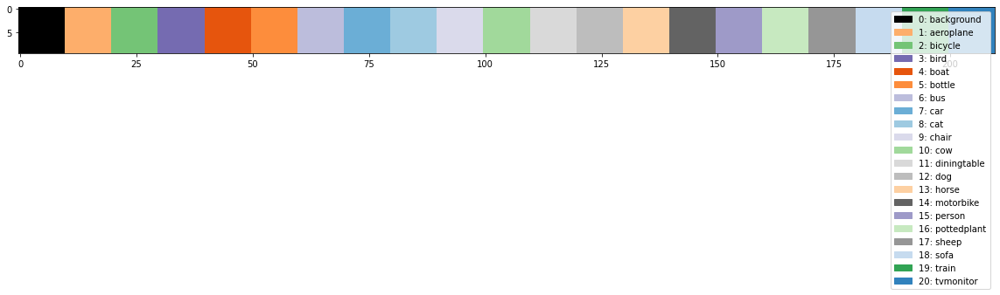

In [53]:
import matplotlib.patches as mpatches

labels = ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']

cmap = plt.cm.get_cmap('tab20c')
colors = (cmap(np.arange(cmap.N)) * 255).astype(np.int)[:, :3].tolist()
np.random.seed(2020)
np.random.shuffle(colors)
colors.insert(0, [0, 0, 0]) # background color must be black
colors = np.array(colors, dtype=np.uint8)

palette_map = np.empty((10, 0, 3), dtype=np.uint8)
legend = []

for i in range(21):
    legend.append(mpatches.Patch(color=np.array(colors[i]) / 255., label='%d: %s' % (i, labels[i])))
    c = np.full((10, 10, 3), colors[i], dtype=np.uint8)
    palette_map = np.concatenate([palette_map, c], axis=1)

plt.figure(figsize=(20, 2))
plt.legend(handles=legend)
plt.imshow(palette_map)